# Download Visium HD data
## slices:
https://www.10xgenomics.com/platforms/visium/product-family/dataset-human-crc
## metadata:
https://github.com/10XGenomics/HumanColonCancer_VisiumHD/tree/main/MetaData

# Install dependencies
* spatialdata
* spatialdata_io
* spatialdata_plot

In [ ]:
from spatialdata_io import visium_hd
import spatialdata as sd
import spatialdata_plot
import scanpy as sc
import numpy as np
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
from sklearn.neighbors import NearestNeighbors
Image.MAX_IMAGE_PIXELS=None

# 1. Read visium HD

In [1]:
s = 'P5'
slide=f'Visium_HD_Human_Colon_Cancer_{s}'

In [ ]:
sdata = visium_hd(
    path=f'./HumanColonCancer_VisiumHD/Data/{slide}',\
    load_all_images=True,
)

## convert it to zarr and reload it to enbale fast calculation

In [ ]:
sdata.write(f"./HumanColonCancer_VisiumHD/Data/{slide}/{slide}.zarr")

In [ ]:
sdata = sd.read_zarr(f"./HumanColonCancer_VisiumHD/Data/{slide}/{slide}.zarr")

## check images

INFO     Dropping coordinate system 'Visium_HD_Human_Colon_Cancer_P5_downscaled_lowres' since it doesn't have      
         relevant elements.                                                                                        
INFO     Dropping coordinate system 'Visium_HD_Human_Colon_Cancer_P5_downscaled_hires' since it doesn't have       
         relevant elements.                                                                                        
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Dropping coordinate system 'Visium_HD_Human_Colon_Cancer_P5_downscaled_lowres' since it doesn't have      
         relevant elements.                                                                                        
INFO     Dropping coordinate system 'Visium_HD_Human_Colon_Cancer_P5_downscaled_hires' since it doesn't have       
         relevant elements.                                             

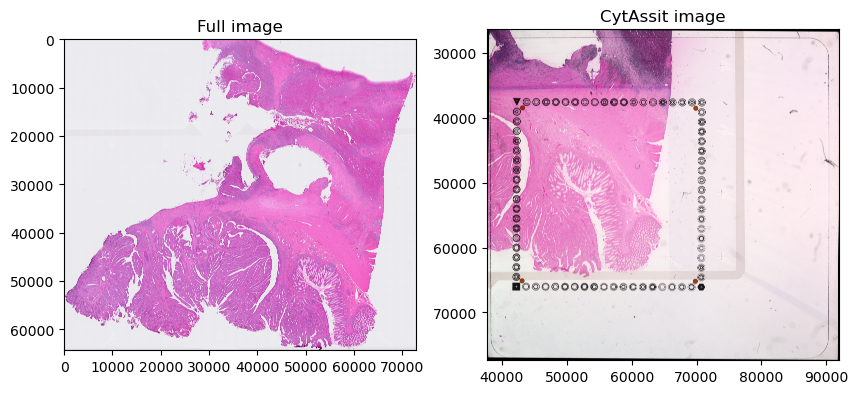

In [6]:
axes = plt.subplots(1, 2, figsize=(10, 5))[1].flatten()
sdata.pl.render_images(f"{slide}_full_image").pl.show(ax=axes[0], title="Full image")
sdata.pl.render_images(f"{slide}_cytassist_image").pl.show(ax=axes[1], title="CytAssit image")

# 2. Add metadata

In [ ]:
parquet = pd.read_parquet(f'./HumanColonCancer_VisiumHD/MetaData/{s}CRC_Metadata.parquet')
parquet

,barcode,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
0,s_008um_00000_00000-1,0,364.459122,-526.477072,None,None,None,None,None,None,None,None
1,s_008um_00000_00001-1,0,364.699627,-526.478064,None,None,None,None,None,None,None,None
2,s_008um_00000_00002-1,0,364.940132,-526.479056,None,None,None,None,None,None,None,None
3,s_008um_00000_00003-1,0,365.180637,-526.480048,None,None,None,None,None,None,None,None
4,s_008um_00000_00004-1,0,365.421142,-526.481040,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,565.629573,-326.003298,None,None,None,None,None,None,None,None
702240,s_008um_00837_00834-1,0,565.870079,-326.004282,None,None,None,None,None,None,None,None
702241,s_008um_00837_00835-1,0,566.110586,-326.005267,None,None,None,None,None,None,None,None
702242,s_008um_00837_00836-1,0,566.351092,-326.006251,None,None,None,None,None,None,None,None


In [8]:
sdata['square_008um'].obs =  sdata['square_008um'].obs.join(parquet.set_index('barcode'),  how='left')
sdata['square_008um'].obs

,in_tissue,array_row,array_col,location_id,region,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
s_008um_00602_00290-1,1,602,290,0,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,434.803906,-381.983277,singlet,vSM,Unknown III (SM),Tissue,Smooth Muscle,SmoothMuscle-2,None,None
s_008um_00789_00234-1,1,789,234,1,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,421.521696,-336.956843,None,None,None,Tissue,Fibroblast,Fibroblast-0,None,None
s_008um_00728_00006-1,1,728,6,2,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,366.628133,-351.401794,doublet_uncertain,mRegDC,CAF,Tissue,T cells,Tcells-0,None,None
s_008um_00526_00291-1,1,526,291,3,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,434.968967,-400.261683,None,None,None,Tissue,Unknown,Unknown-0,None,None
s_008um_00681_00396-1,1,681,396,4,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,460.375347,-363.089077,None,None,None,Tissue,Smooth Muscle,SmoothMuscle-0,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00653_00166-1,1,653,166,541963,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,405.032707,-369.595995,singlet,CD4 T cell,Proliferating Immune II,Tissue,T cells,Tcells-0,None,None
s_008um_00565_00244-1,1,565,244,541964,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,423.704146,-390.836074,doublet_certain,Myofibroblast,Plasma,Tissue,B cells,Bcells-3,None,None
s_008um_00797_00672-1,1,797,672,541965,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,526.868792,-335.464309,doublet_certain,Mature B,Fibroblast,Tissue,T cells,Tcells-0,None,None
s_008um_00353_00477-1,1,353,477,541966,Visium_HD_Human_Colon_Cancer_P5_square_008um,1,479.531390,-442.051476,singlet,Fibroblast,Proliferating Fibroblast,Tissue,Fibroblast,Fibroblast-0,None,None


## plot lables on full image

INFO     Rasterizing image for faster rendering.                                                                   


/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P5_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata_plot/pl/basic.py:936: UserWarning: Converting copy of 'UnsupervisedL1' column to categorical dtype for categorical plotting. Consider converting before plotting.
  _render_shapes(


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' do disable this    
         behaviour.                                                                                                


/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata_plot/pl/utils.py:775: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


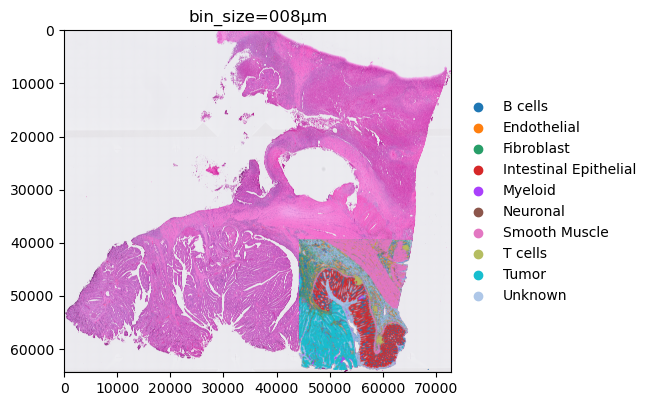

In [9]:
sdata.pl.render_images(f"{slide}_full_image").pl.render_shapes(
    f"{slide}_square_008um", color="UnsupervisedL1"
).pl.show(coordinate_systems=slide, title="bin_size=008µm")

## check spatial

In [10]:
print(sdata['square_002um'].obsm['spatial'])
print(sdata['square_002um'].obsm['spatial'][:, 0].max())
print(sdata['square_002um'].obsm['spatial'][:, 0].min())
print(sdata['square_002um'].obsm['spatial'][:, 1].max())
print(sdata['square_002um'].obsm['spatial'][:, 1].min())

[[46530.04979159 48950.84329353]
 [59850.02334854 58925.79709819]
 [45360.82497763 49055.6145628 ]
 ...
 [56063.01843222 50750.45759851]
 [57359.89483928 48038.36812584]
 [45105.21732519 41990.97777626]]
68734.983781102
44280.59290708855
64076.159171259045
39511.75092759462


## crop image to spots locations and plot labels

In [11]:
def crop0(x):
    return sd.bounding_box_query(
        x,
        min_coordinate=[44000, 39000],
        max_coordinate=[70000, 65000],
        axes=("x", "y"),
        target_coordinate_system=slide,
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18604651..1.0].
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P5_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata_plot/pl/basic.py:936: UserWarning: Converting copy of 'UnsupervisedL1' column to categoric

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' do disable this    
         behaviour.                                                                                                


/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata_plot/pl/utils.py:775: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


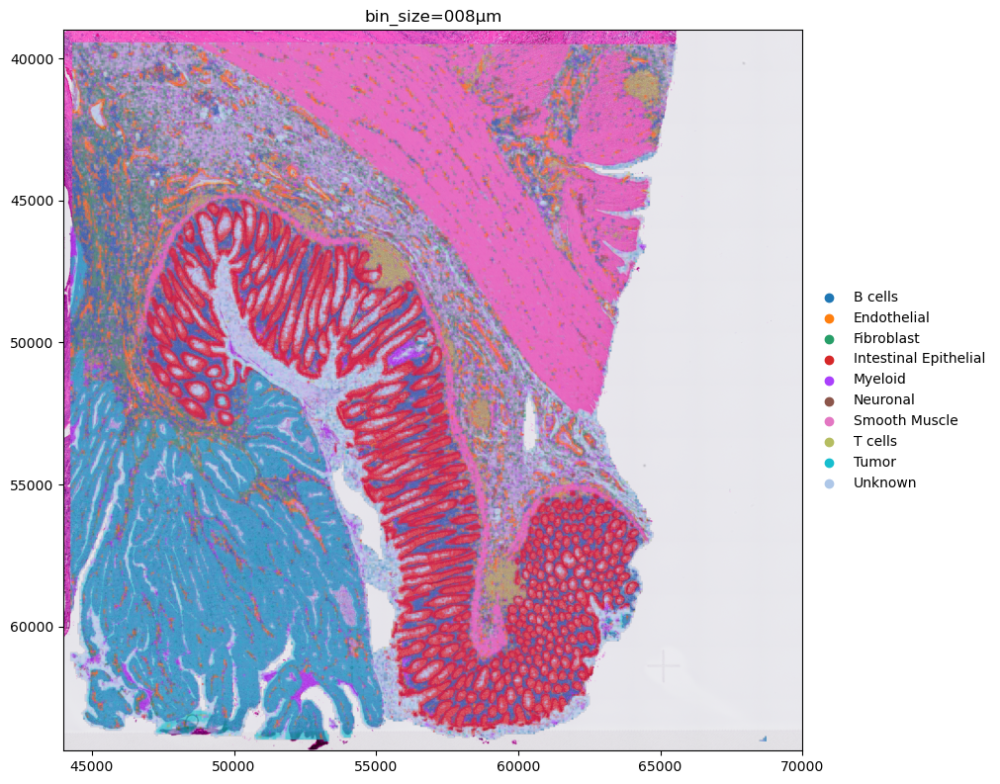

In [12]:
crop0(sdata).pl.render_images(f"{slide}_full_image").pl.render_shapes(
    f"{slide}_square_008um", color="UnsupervisedL1", fill_alpha =0.8
).pl.show(coordinate_systems=slide, title="bin_size=008µm", figsize=(10, 10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18604651..1.0].


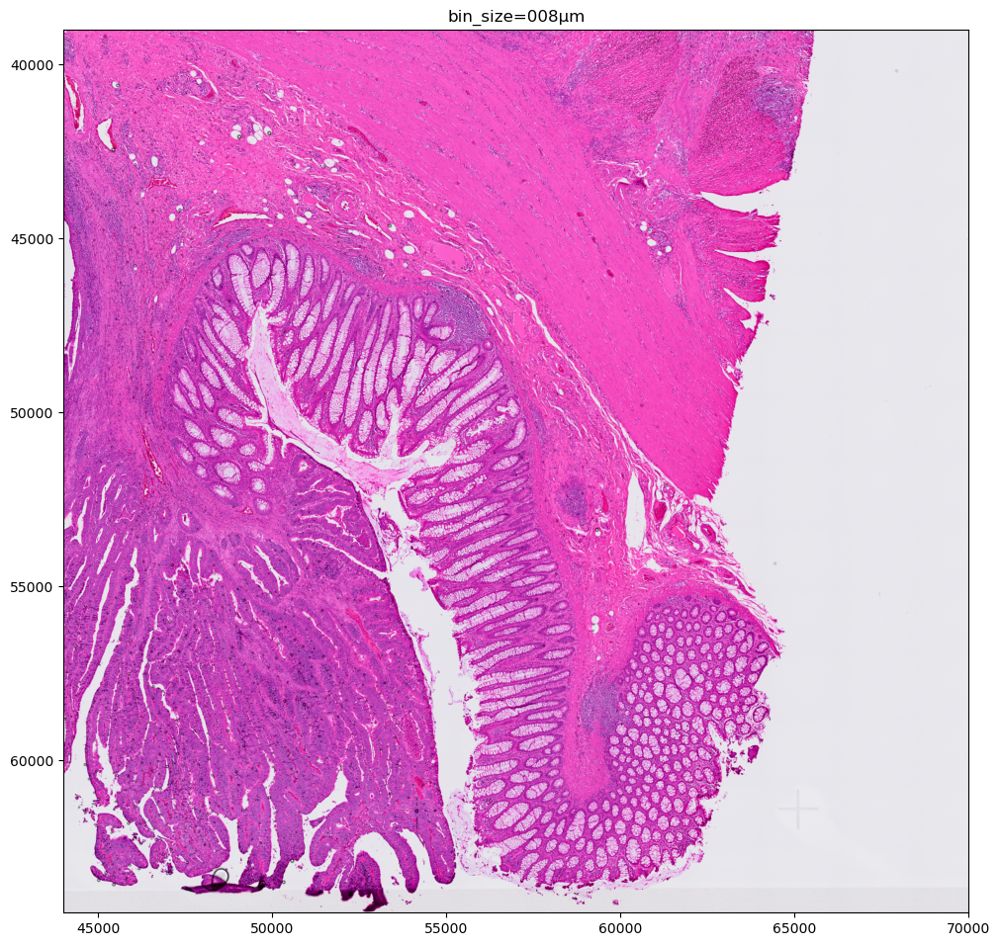

In [13]:
crop0(sdata).pl.render_images(f"{slide}_full_image").pl.show(coordinate_systems=slide, title="bin_size=008µm", figsize=(10, 10))

## Note that the bins are slanted

In [14]:
def crop1(x):
    return sd.bounding_box_query(
        x,
        min_coordinate=[50000, 50000],
        max_coordinate=[50060, 50060],
        axes=("x", "y"),
        target_coordinate_system=slide,
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.064516..1.0].
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P5_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/software/miniforge3/envs/stlearn/lib/python3.10/site-packages/spatialdata_plot/pl/basic.py:936: UserWarning: Converting copy of 'UnsupervisedL1' column to categorical

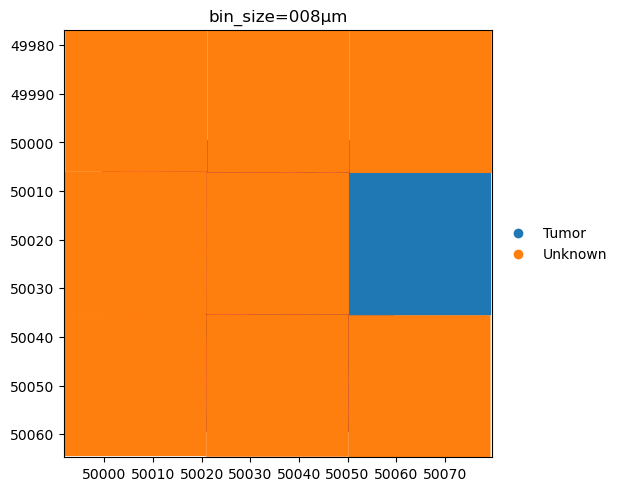

In [15]:
crop1(sdata).pl.render_images(f"{slide}_full_image").pl.render_shapes(
    f"{slide}_square_008um", color="UnsupervisedL1"
).pl.show(coordinate_systems=slide, title="bin_size=008µm")

# 3. convert to h5ad

In [ ]:
sdata['square_008um'].write(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_008um_with_label.h5ad', compression='gzip')

# 4. convert the h5ad to Stereo-seq-like:
* spatial locations should align to coordinates (rotate)
* bin1 is 500nm, each image pixel is a bin1 (rescale)
* spatial locations should be the top left corners of bins (minus half bin size)
* (crop)
* spatial locations should be sorted by x then y (sort)

In [ ]:
adata = sc.read_h5ad(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_008um_with_label.h5ad')
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

## 4.1 Rotate the expression matrix and image

### first we define a function to calculate the rotation matrix and rotation angle

In [18]:
def estimate_grid_rotation_matrix_nn(points, n_neighbors=4, resolution=180, plot_histogram=False):
    """
    Estimate the rotation matrix to align the grid using nearest neighbor vectors.
    
    Args:
        points: (N, 2) numpy array of x, y coordinates.
        n_neighbors: Number of nearest neighbors to consider for each point.
        resolution: The resolution to search for rotation angle
        plot_histogram: If True, plot the angle histogram.
        
    Returns:
        rotation_matrix: 2x2 numpy array, the rotation matrix to align the grid.
    """
    # 1. Find nearest neighbors
    nbrs = NearestNeighbors(n_neighbors=n_neighbors+1, algorithm='auto').fit(points)
    distances, indices = nbrs.kneighbors(points)
    
    # 2. Compute vectors to neighbors (exclude self, which is always the first neighbor)
    vectors = []
    for i in range(points.shape[0]):
        for j in range(1, n_neighbors+1):
            vec = points[indices[i, j]] - points[i]
            if np.linalg.norm(vec) > 1e-8:  # avoid zero vectors
                vectors.append(vec)
    vectors = np.array(vectors)
    
    # 3. Calculate angles
    angles = np.arctan2(vectors[:, 1], vectors[:, 0])
    angles_mod = np.mod(angles, np.pi/2)  # modulo 90 degrees
    
    # 4. Histogram
    hist, bin_edges = np.histogram(angles_mod, bins=resolution, range=(0, np.pi/2))
    peak_bin = np.argmax(hist)
    angle_peak = (bin_edges[peak_bin] + bin_edges[peak_bin+1]) / 2
    
    # 5. (Optional) Plot histogram
    if plot_histogram:
        plt.figure(figsize=(6,3))
        plt.bar(np.degrees(bin_edges[:-1]), hist, width=np.degrees(bin_edges[1]-bin_edges[0]))
        plt.axvline(np.degrees(angle_peak), color='r', linestyle='--', label=f'Peak: {np.degrees(angle_peak):.2f}°')
        plt.xlabel('Angle (degrees, mod 90°)')
        plt.ylabel('Count')
        plt.title('Nearest Neighbor Vector Angle Histogram')
        plt.legend()
        plt.show()
    
    # 6. Build rotation matrix for -angle_peak (to align grid with axes)
    c, s = np.cos(-angle_peak), np.sin(-angle_peak)
    rotation_matrix = np.array([[c, -s], [s, c]])
    
    return rotation_matrix, np.degrees(angle_peak), hist

# Example usage:
# points = np.array([[x1, y1], [x2, y2], ...])
# rotation_matrix = estimate_grid_rotation_matrix_nn(points, n_neighbors=4, plot_histogram=True)
# rotated_points = (points - np.mean(points, axis=0)) @ rotation_matrix.T

### read the positions of a whole grid

In [ ]:
tissue_positions=pd.read_parquet(f'./HumanColonCancer_VisiumHD/Data/{slide}/binned_outputs/square_008um/spatial/tissue_positions.parquet')
tissue_positions

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
0,s_008um_00000_00000-1,0,0,0,63964.334952,44279.963120
1,s_008um_00000_00001-1,0,0,1,63964.455476,44309.183268
2,s_008um_00000_00002-1,0,0,2,63964.576000,44338.403418
3,s_008um_00000_00003-1,0,0,3,63964.696524,44367.623570
4,s_008um_00000_00004-1,0,0,4,63964.817047,44396.843725
...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,837,833,39607.772562,68721.168182
702240,s_008um_00837_00834-1,0,837,834,39607.892170,68750.388527
702241,s_008um_00837_00835-1,0,837,835,39608.011777,68779.608876
702242,s_008um_00837_00836-1,0,837,836,39608.131385,68808.829226


### calculate the rotation angle

In [32]:
positions = tissue_positions[['pxl_col_in_fullres', 'pxl_row_in_fullres']].values
rotation_matrix, angle_degree, hist = estimate_grid_rotation_matrix_nn(positions, n_neighbors=4, resolution=23040)
angle_degree

0.236328125

In [33]:
hist[:100]

array([      0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0, 2805628,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,     

### rotate adata.obsm['spatial']
after rotation, points are nearly aligned to coordinates

In [34]:
adata.obsm['spatial']

array([[52826.503124  , 46409.0604248 ],
       [51212.78093867, 40938.57358166],
       [44543.48709883, 42693.5629521 ],
       ...,
       [64011.9268705 , 40757.23812271],
       [58260.66903321, 53707.04661851],
       [62205.27154699, 46652.06843235]])

In [35]:
adata.obsm['spatial'][np.lexsort((adata.obsm['spatial'][:, 1], adata.obsm['spatial'][:, 0]))]

array([[44291.59590279, 61159.18498311],
       [44291.71707684, 61129.96486004],
       [44291.83825086, 61100.74474087],
       ...,
       [68738.35252863, 63977.5522952 ],
       [68738.4720761 , 63948.33088546],
       [68738.59162356, 63919.10947961]])

In [36]:
center = np.mean(positions, axis=0)
center

array([56559.22013369, 51786.25843248])

In [37]:
rotated_points = (adata.obsm['spatial'] - center) @ rotation_matrix.T + center
rotated_points

array([[52804.35558997, 46424.5024751 ],
       [51168.08305748, 40960.7182744 ],
       [44506.08474148, 42743.20150017],
       ...,
       [63966.37215941, 40726.59182059],
       [58268.57721975, 53700.01232617],
       [62184.04656496, 46628.82388251]])

In [38]:
rotated_points[np.lexsort((rotated_points[:, 1], rotated_points[:, 0]))]

array([[44330.36069535, 61209.70542556],
       [44330.36134435, 61180.48505125],
       [44330.36199334, 61151.26468083],
       ...,
       [68788.53524346, 63956.43507476],
       [68788.53622633, 63985.65673683],
       [68788.53720919, 64014.87840279]])

In [39]:
adata.obsm['spatial'] = rotated_points

### rotate the image

In [ ]:
full_image = Image.open(f"./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_tissue_image.btf")

In [41]:
# Use Image.Resampling.NEAREST (0), Image.Resampling.BILINEAR (2) or Image.Resampling.BICUBIC (3)
rot = full_image.rotate(angle_degree, Image.Resampling.BICUBIC, center=tuple(center))

## 4.2 rescale the spatial coordinates and the image

### load scalefactor

In [ ]:
scalefactors = json.load(open(f'./HumanColonCancer_VisiumHD/Data/{slide}/binned_outputs/square_008um/spatial/scalefactors_json.json'))

In [43]:
scalefactors['spot_diameter_fullres']

29.229786763701995

In [44]:
original_width, original_height = full_image.size
scale_factor = 16 / scalefactors['spot_diameter_fullres']
scale_factor

0.5473868191152543

### rescale adata.obsm['spatial']

In [45]:
adata.obsm['spatial'] = adata.obsm['spatial'] * scale_factor
adata.obsm['spatial']

array([[28904.40824182, 25412.16073885],
       [28008.73422506, 22421.3572849 ],
       [24362.04415792, 23397.06510798],
       ...,
       [35014.34898668, 22293.19955008],
       [31895.45113869, 29394.67893367],
       [34038.72744891, 25524.00358413]])

### rescale image

In [46]:
new_width = int(original_width * scale_factor)
new_height = int(original_height * scale_factor)
rot_resized = rot.resize((new_width, new_height), Image.Resampling.LANCZOS)
rot_resized.size

(39902, 35235)

## 4.3 set adata.obsm['spatial'] to be the top left corner of bins

In [47]:
# set the origin of spatial to top left corner
adata.obsm['spatial'] = adata.obsm['spatial'] - 8
adata.obsm['spatial']

array([[28896.40824182, 25404.16073885],
       [28000.73422506, 22413.3572849 ],
       [24354.04415792, 23389.06510798],
       ...,
       [35006.34898668, 22285.19955008],
       [31887.45113869, 29386.67893367],
       [34030.72744891, 25516.00358413]])

## 4.4 crop the image and align spatial coordinates to the cropped image

### check the min and max of spatial

In [48]:
print(np.min(adata.obsm['spatial'], axis=0))
print(np.max(adata.obsm['spatial'] + 16, axis=0))

[24257.85513126 21645.42437524]
[37661.93857453 35048.90111117]


### shift spatial, leave some space at edges

In [49]:
shift=[24000, 21400]
adata.obsm['spatial'] = adata.obsm['spatial'] - shift
adata.obsm['spatial']

array([[ 4896.40824182,  4004.16073885],
       [ 4000.73422506,  1013.3572849 ],
       [  354.04415792,  1989.06510798],
       ...,
       [11006.34898668,   885.19955008],
       [ 7887.45113869,  7986.67893367],
       [10030.72744891,  4116.00358413]])

### crop image 

In [50]:
crop_rot_resized = rot_resized.crop([*shift, 37900, 35300])
crop_rot_resized.size

(13900, 13900)

### remove bins with negative spatial

In [51]:
adata_sub = adata[(adata.obsm['spatial'][:, 0]>0)&(adata.obsm['spatial'][:, 1]>0)]
adata_sub = adata_sub.copy()
adata_sub

AnnData object with n_obs × n_vars = 541968 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

## 4.5 sort the expression

In [52]:
indices = np.lexsort((adata_sub.obsm['spatial'][:, 1], adata_sub.obsm['spatial'][:, 0]))
indices

array([152127, 316252, 139062, ..., 243460,  85659, 234385])

In [53]:
adata_sub = adata_sub[indices]
adata_sub = adata_sub.copy()

## 4.6 check if the image and expression look good

/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/tmp/ipykernel_13423/510621298.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=12, img=crop_rot_resized, alpha_img=1, ax=ax)


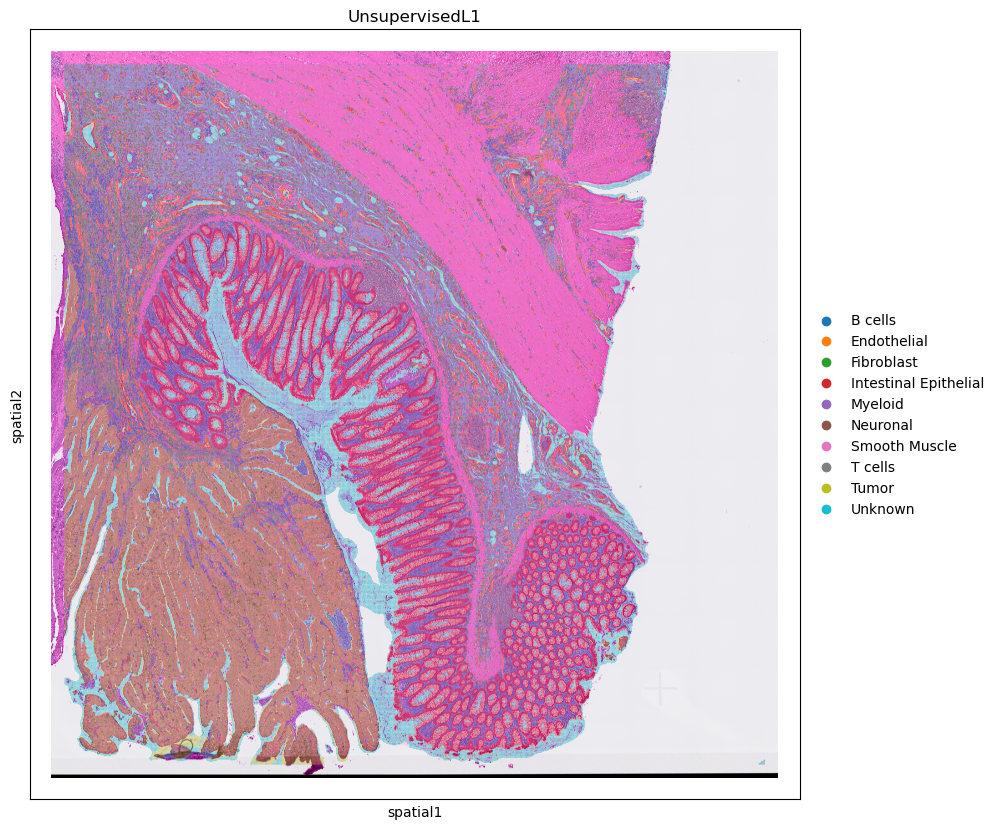

In [54]:
ax = plt.subplots(1, 1, figsize=(12, 10))[1]
sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=12, img=crop_rot_resized, alpha_img=1, ax=ax)

/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/tmp/ipykernel_13423/3469349877.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=12, img=crop_rot_resized, alpha_img=1, crop_coord=(3000, 6000, 10000, 13000), ax=ax)


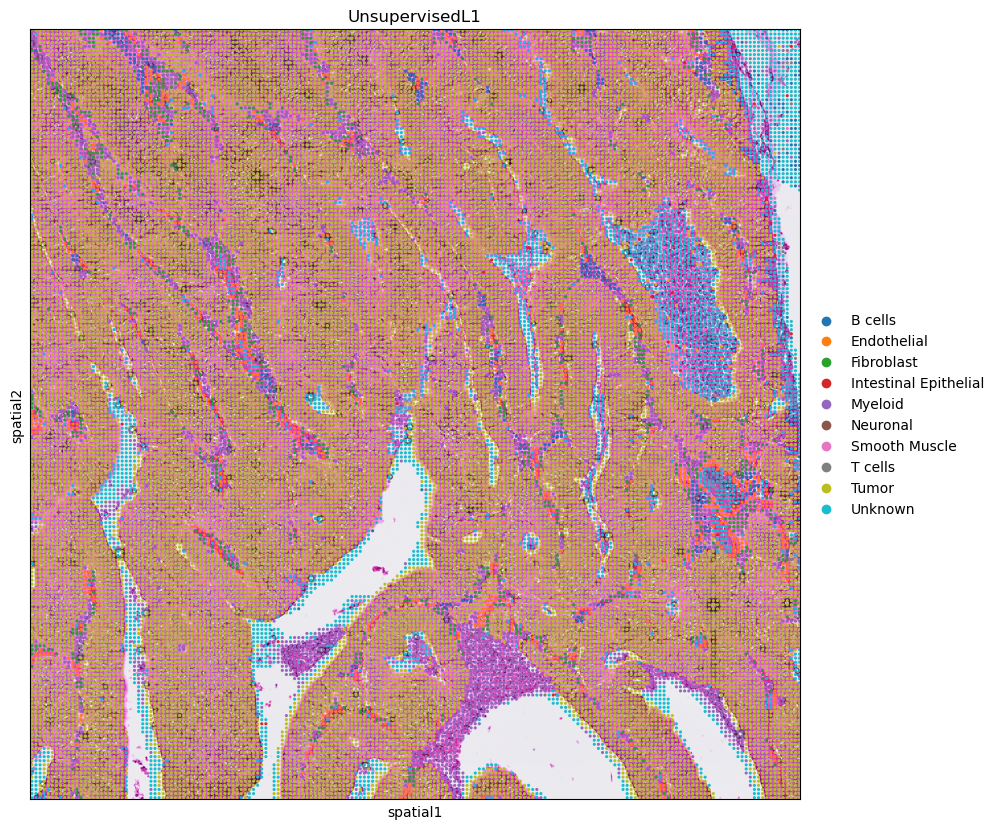

In [55]:
ax = plt.subplots(1, 1, figsize=(12, 10))[1]
sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=12, img=crop_rot_resized, alpha_img=1, crop_coord=(3000, 6000, 10000, 13000), ax=ax)

## 4.7 save adata and image

In [56]:
# fit with SAW h5ad format
adata_sub.obs[['x', 'y']] = adata_sub.obsm['spatial']
adata_sub.uns['bin_size'] = 16
adata_sub.uns["bin_type"] = "bins"

In [ ]:
adata_sub.write_h5ad(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_008um_with_label_st.h5ad', compression='gzip')

In [ ]:
crop_rot_resized.save(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_image_full.tiff')

In [ ]:
adata_sub = sc.read_h5ad(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_008um_with_label_st.h5ad')
sc.settings.figdir = './'
crop_rot_resized = Image.open(f'./HumanColonCancer_VisiumHD/Data/{slide}/{slide}_image_full.tiff')

/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/tmp/ipykernel_107685/592922379.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=16, img=crop_rot_resized, alpha_img=1, ax=ax, save='_UnsupervisedL1.png')


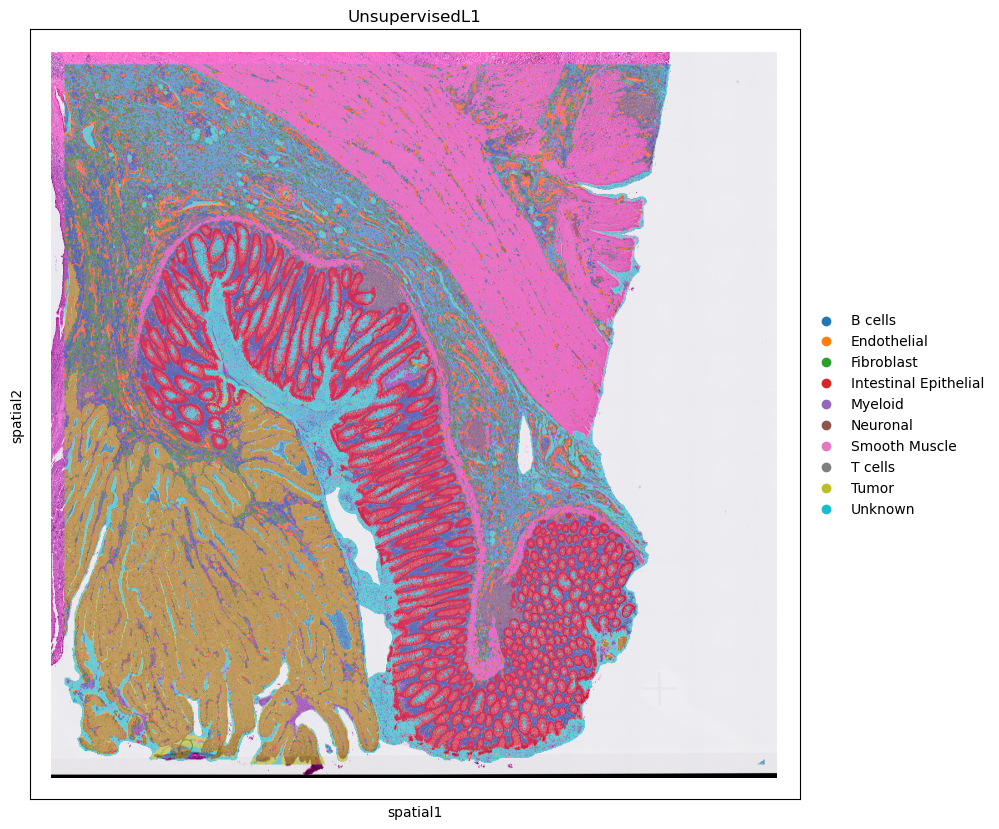

In [4]:
ax = plt.subplots(1, 1, figsize=(12, 10))[1]
sc.pl.spatial(adata_sub, color='UnsupervisedL1', spot_size=16, img=crop_rot_resized, alpha_img=1, ax=ax, save='_UnsupervisedL1.png')

/storeData/USER/data/02.Bioinformatics_for_STOmics/01.user/zhongzheng/tmp/ipykernel_107685/925271796.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_sub, color='UnsupervisedL2', spot_size=16, img=crop_rot_resized, alpha_img=1, ax=ax, save='_UnsupervisedL2.png')


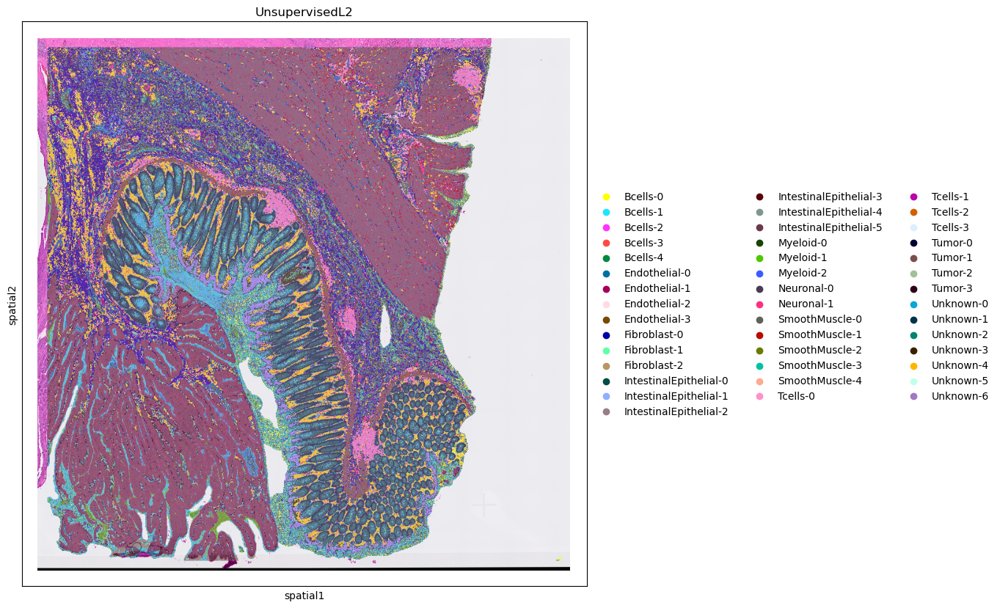

In [5]:
ax = plt.subplots(1, 1, figsize=(12, 10))[1]
sc.pl.spatial(adata_sub, color='UnsupervisedL2', spot_size=16, img=crop_rot_resized, alpha_img=1, ax=ax, save='_UnsupervisedL2.png')